# Demo code for ImplicitTerrain

## Setup env

SIREN demo code from [official colab](https://colab.research.google.com/github/vsitzmann/siren/blob/master/explore_siren.ipynb).

In [2]:
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import os

from PIL import Image
from torchvision.transforms import Resize, Compose, ToTensor, Normalize
import numpy as np
import skimage
import matplotlib.pyplot as plt

import time
from typing import OrderedDict


def get_mgrid(sidelen, dim=2):
    """Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int"""
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid


class SineLayer(nn.Module):
    # See paper sec. 3.2, final paragraph, and supplement Sec. 1.5 for discussion of omega_0.

    # If is_first=True, omega_0 is a frequency factor which simply multiplies the activations before the
    # nonlinearity. Different signals may require different omega_0 in the first layer - this is a
    # hyperparameter.

    # If is_first=False, then the weights will be divided by omega_0 so as to keep the magnitude of
    # activations constant, but boost gradients to the weight matrix (see supplement Sec. 1.5)

    def __init__(
        self, in_features, out_features, bias=True, is_first=False, omega_0=30
    ):
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first

        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)

        self.init_weights()

    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                self.linear.weight.uniform_(-1 / self.in_features, 1 / self.in_features)
            else:
                self.linear.weight.uniform_(
                    -np.sqrt(6 / self.in_features) / self.omega_0,
                    np.sqrt(6 / self.in_features) / self.omega_0,
                )

    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))

    def forward_with_intermediate(self, input):
        # For visualization of activation distributions
        intermediate = self.omega_0 * self.linear(input)
        return torch.sin(intermediate), intermediate


class Siren(nn.Module):
    def __init__(
        self,
        in_features,
        hidden_features,
        hidden_layers,
        out_features,
        outermost_linear=False,
        first_omega_0=30,
        hidden_omega_0=30.0,
    ):
        super().__init__()

        self.net = []
        self.net.append(
            SineLayer(
                in_features, hidden_features, is_first=True, omega_0=first_omega_0
            )
        )

        for i in range(hidden_layers):
            self.net.append(
                SineLayer(
                    hidden_features,
                    hidden_features,
                    is_first=False,
                    omega_0=hidden_omega_0,
                )
            )

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)

            with torch.no_grad():
                final_linear.weight.uniform_(
                    -np.sqrt(6 / hidden_features) / hidden_omega_0,
                    np.sqrt(6 / hidden_features) / hidden_omega_0,
                )

            self.net.append(final_linear)
        else:
            self.net.append(
                SineLayer(
                    hidden_features,
                    out_features,
                    is_first=False,
                    omega_0=hidden_omega_0,
                )
            )

        self.net = nn.Sequential(*self.net)

    def forward(self, coords):
        coords = (
            coords.clone().detach().requires_grad_(True)
        )  # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords

    def forward_with_activations(self, coords, retain_grad=False):
        """Returns not only model output, but also intermediate activations.
        Only used for visualizing activations later!"""
        activations = OrderedDict()

        activation_count = 0
        x = coords.clone().detach().requires_grad_(True)
        activations["input"] = x
        for i, layer in enumerate(self.net):
            if isinstance(layer, SineLayer):
                x, intermed = layer.forward_with_intermediate(x)

                if retain_grad:
                    x.retain_grad()
                    intermed.retain_grad()

                activations[
                    "_".join((str(layer.__class__), "%d" % activation_count))
                ] = intermed
                activation_count += 1
            else:
                x = layer(x)

                if retain_grad:
                    x.retain_grad()

            activations["_".join((str(layer.__class__), "%d" % activation_count))] = x
            activation_count += 1

        return activations


class ImageFitting(Dataset):
    def __init__(self, img, sidelength):
        super().__init__()
        self.pixels = img.permute(1, 2, 0).view(-1, 1)
        self.coords = get_mgrid(sidelength, 2)

    def __len__(self):
        return 1

    def __getitem__(self, idx):
        if idx > 0:
            raise IndexError

        return self.coords, self.pixels

In [3]:
random_seed = 0
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
np.random.seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

## Fit a terrain in raster format

In [4]:
geotiff_path = "./implicitterrain_demo/2494_1141.tif"
sidelength = 1000

hidden_layers = 3
hidden_features = 512

tile_name = geotiff_path.split("/")[-1].split(".")[0]
output_dir = f"./implicitterrain_demo/{tile_name}"
os.makedirs(output_dir, exist_ok=True)

In [8]:
def hillshade(array, azimuth=315, angle_altitude=45):
    from matplotlib.colors import LightSource

    fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
    ls = LightSource(azdeg=azimuth, altdeg=angle_altitude)
    cmap = plt.cm.gist_earth
    rgb = ls.shade(array, cmap=cmap)
    ax.imshow(rgb)
    ax.axis("off")
    
    return ax

def fft_of_img(img):
    # np.abs is used to get the magnitude of the complex number
    return np.log(np.abs(np.fft.fftshift(np.fft.fft2(img))))

Value range: (1158.7689, 1372.9056)
Image shape: torch.Size([1, 1000, 1000]), min: -0.9991728663444519, max: 0.9991145133972168


<Axes: >

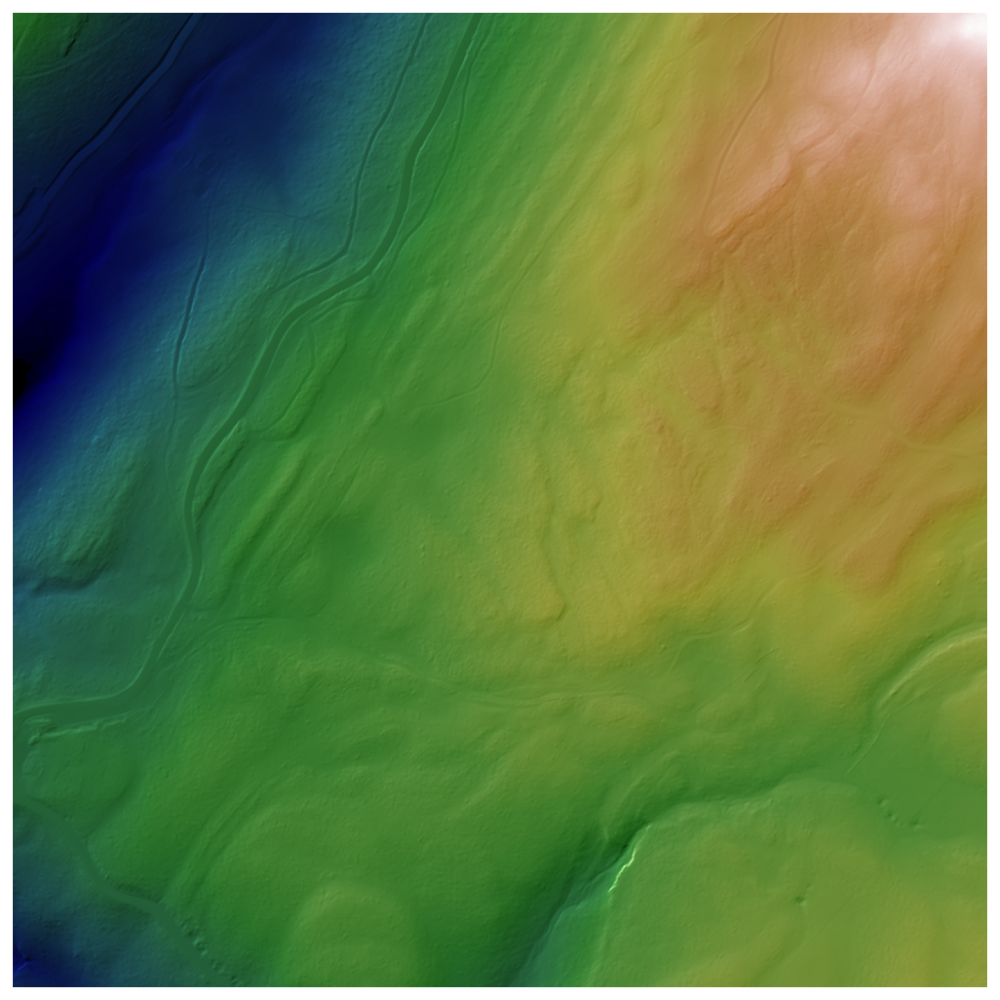

In [6]:
img = Image.open(geotiff_path)
img = np.array(img)

value_range = (np.min(img), np.max(img))
print(f"Value range: {value_range}")

img = (img - value_range[0]) / (value_range[1] - value_range[0])
img = Image.fromarray(img)
img = Compose(
    [
        Resize(sidelength),
        ToTensor(),
        Normalize(torch.Tensor([0.5]), torch.Tensor([0.5])),
    ]
)(img)

print(f"Image shape: {img.shape}, min: {img.min()}, max: {img.max()}")

gt_img = img.view(sidelength, sidelength).numpy()
hillshade(gt_img)

In [7]:
from tqdm.notebook import tqdm

def fit_inr(img, sidelength, model, dataloader, num_steps, steps_til_summary):
    model.cuda()
    model.train()

    optim = torch.optim.Adam(lr=1e-4, params=model.parameters())

    starttime = time.time()
    for step in tqdm(range(num_steps)):
        for coords, pixel_values in dataloader:
            coords, pixel_values = coords.cuda(), pixel_values.cuda()

            model_output, _ = model(coords)
            loss = F.mse_loss(model_output, pixel_values)

            optim.zero_grad()
            loss.backward()
            optim.step()

            if step % steps_til_summary == 0:
                print(f"Step {step}, Loss {loss.item():.8f}, PSNR {10 * torch.log10(1 / loss):.3f}, Time {time.time() - starttime:.2f}")

    endtime = time.time()
    print(f"Training took {endtime - starttime} seconds")

    return model


## Benchmark single model

In [22]:
model = Siren(
    in_features=2,
    hidden_features=hidden_features,
    hidden_layers=hidden_layers,
    out_features=1,
    outermost_linear=True,
)

if os.path.exists(f"{output_dir}/benchmark.pth"):
    model.load_state_dict(torch.load(f"{output_dir}/benchmark.pth"))
else:
    dataloader = DataLoader(
        ImageFitting(img, sidelength),
        batch_size=1,
        pin_memory=True,
        num_workers=0,
    )

    model = fit_inr(img, sidelength, model, dataloader, num_steps=6001, steps_til_summary=500)

  0%|          | 0/5000 [00:00<?, ?it/s]

Step 0, Loss 0.16654421389102936, PSNR 7.78470516204834, Time 0.49088525772094727
Step 100, Loss 1.7433894754503854e-05, PSNR 47.586055755615234, Time 38.78455114364624
Step 200, Loss 1.0366588867327664e-05, PSNR 49.84364318847656, Time 77.23639512062073


KeyboardInterrupt: 

Final PSNR: 50.469393730163574


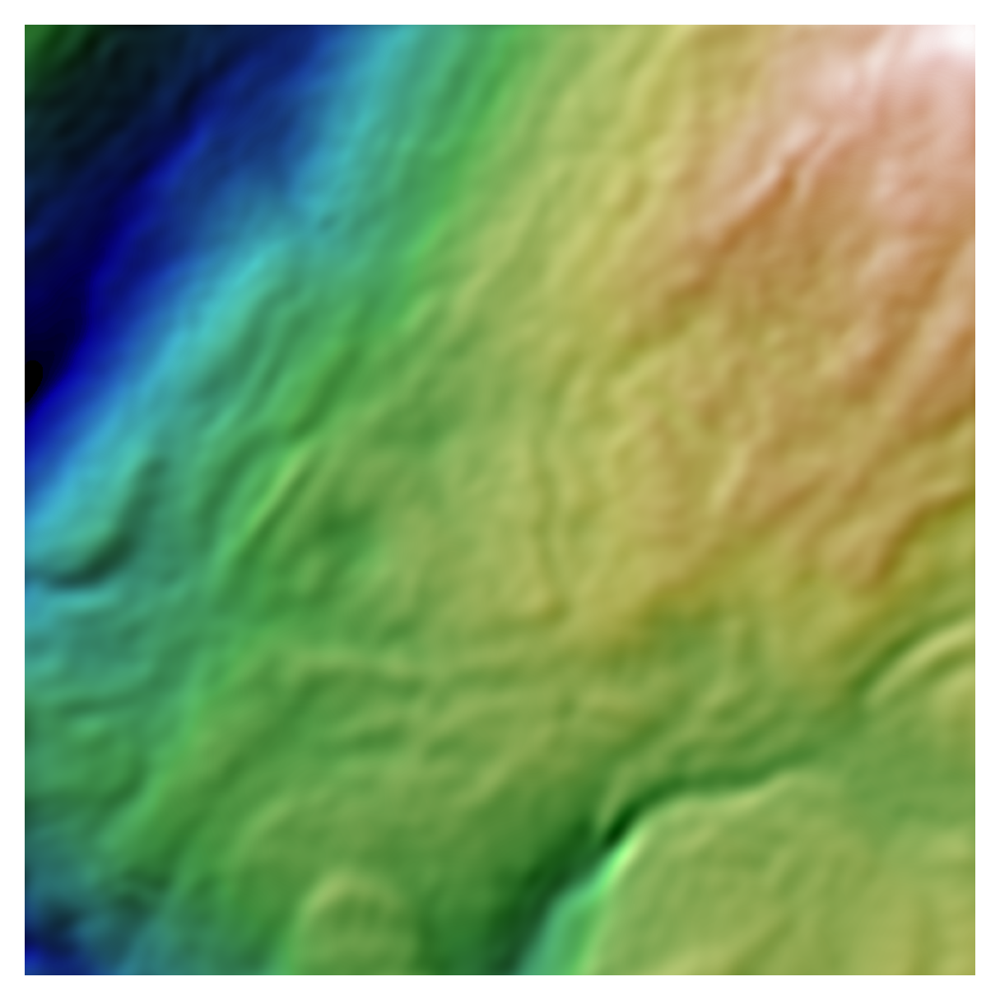

In [29]:
eval_coords = get_mgrid(sidelength, 2).cuda()
model_output, eval_coords = model(eval_coords)

model_output = model_output.view(sidelength, sidelength).cpu().detach().numpy()
psnr = -10 * np.log10(((model_output - gt_img) ** 2).mean())
print(f"Final PSNR: {psnr}")
hillshade(model_output)

In [ ]:
# Save the model
torch.save(model.state_dict(), f"{output_dir}/benchmark.pth")

In [31]:
del model, eval_coords, model_output
torch.cuda.empty_cache()

## Progressive fitting of high resolution terrain

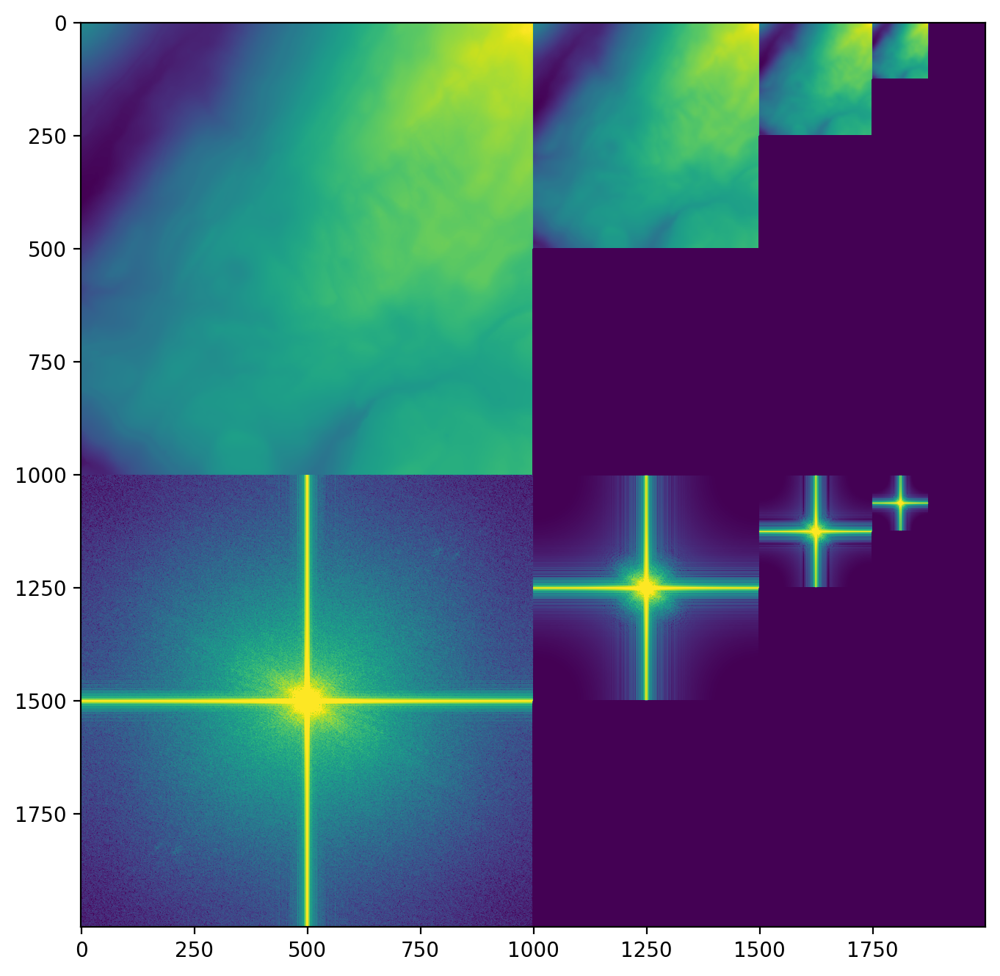

In [9]:
from skimage.transform import pyramid_gaussian

num_of_levels = 3
sigma = 4.0
gaussian_pyramid = tuple(pyramid_gaussian(gt_img, max_layer=num_of_levels, downscale=2, sigma=sigma))

# plot the pyramid
fig = plt.figure(figsize=(8, 8), dpi=200)
vis_array = np.zeros((sidelength * 2, sidelength * 2))
vis_array -= 100
vis_pos = 0
for i, img in enumerate(gaussian_pyramid):
    # print(i, img.shape)
    sl = sidelength >> i
    vis_array[:sl, vis_pos : vis_pos + sl] = img * 4
    vis_array[sidelength : sidelength + sl, vis_pos : vis_pos + sl] = (
        fft_of_img(img)
    )
    vis_pos += sl
plt.imshow(vis_array, vmin=-4, vmax=4)
plt.show()

In [ ]:
shape_model = Siren(
    in_features=2,
    hidden_features=hidden_features // 2,
    hidden_layers=hidden_layers,
    out_features=1,
    outermost_linear=True,
)
geo_model = Siren(
    in_features=2,
    hidden_features=hidden_features // 2,
    hidden_layers=hidden_layers,
    out_features=1,
    outermost_linear=True,
)

if os.path.exists(f"{output_dir}/shape_model.pth"):
    shape_model.load_state_dict(torch.load(f"{output_dir}/shape_model.pth"))
    shape_model.cuda()
    print("Models loaded")
else:
    for i, img in enumerate(reversed(gaussian_pyramid)):
        print(f"Level {i}, img shape: {img.shape}")
        if i < num_of_levels:
            sl = img.shape[0]
            img = torch.from_numpy(img).float().view(1, sl, sl)
            dataloader = DataLoader(
                ImageFitting(img, sl),
                batch_size=1,
                pin_memory=True,
                num_workers=0,
            )
            shape_model = fit_inr(img, sl, shape_model, dataloader, num_steps=600 * (i + 1) + 1, steps_til_summary=500)


Models loaded


Final PSNR: 66.05148792266846


<Axes: >

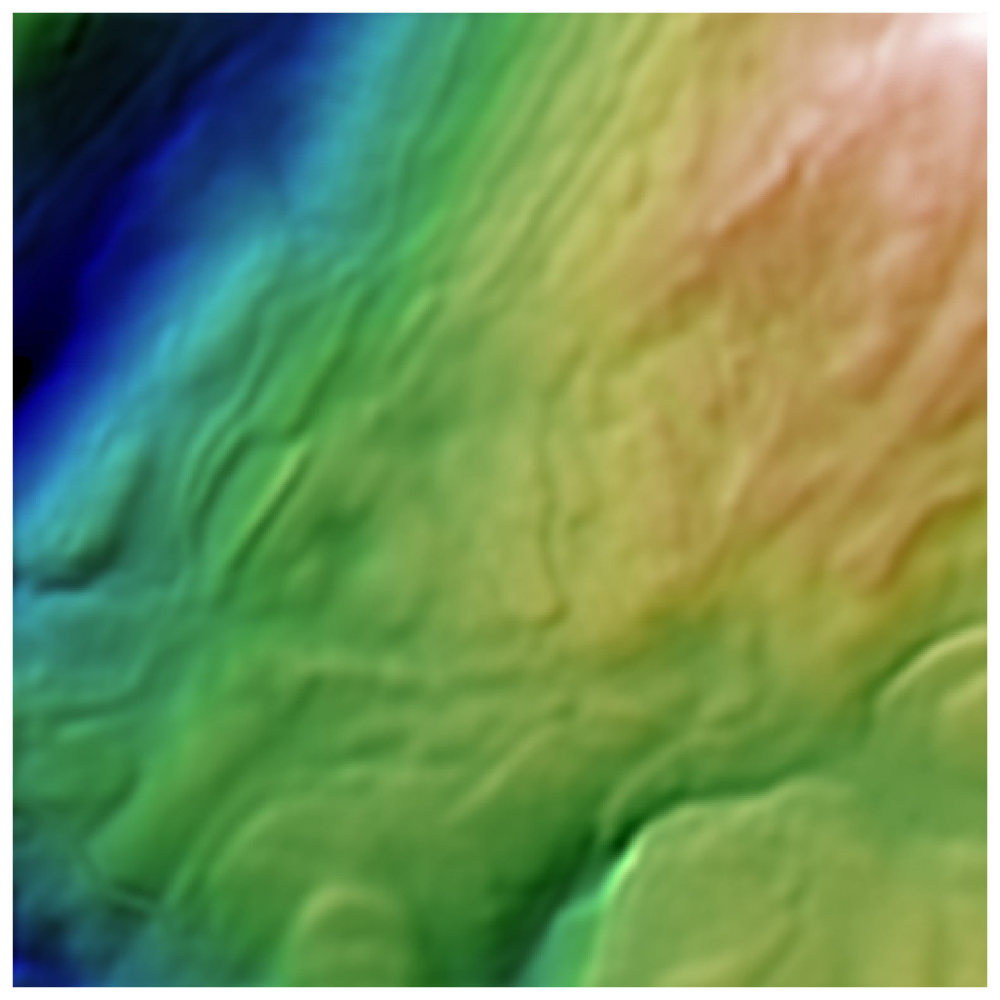

In [14]:
eval_coords = get_mgrid(sidelength // 2, 2).cuda()
model_output, eval_coords = shape_model(eval_coords)

model_output = model_output.view(sidelength // 2, sidelength // 2).cpu().detach().numpy()
psnr = -10 * np.log10(((model_output - gaussian_pyramid[1]) ** 2).mean())
print(f"Final PSNR: {psnr}")
hillshade(model_output)

Residual range: (-0.030785915, 0.028547168)
Models loaded


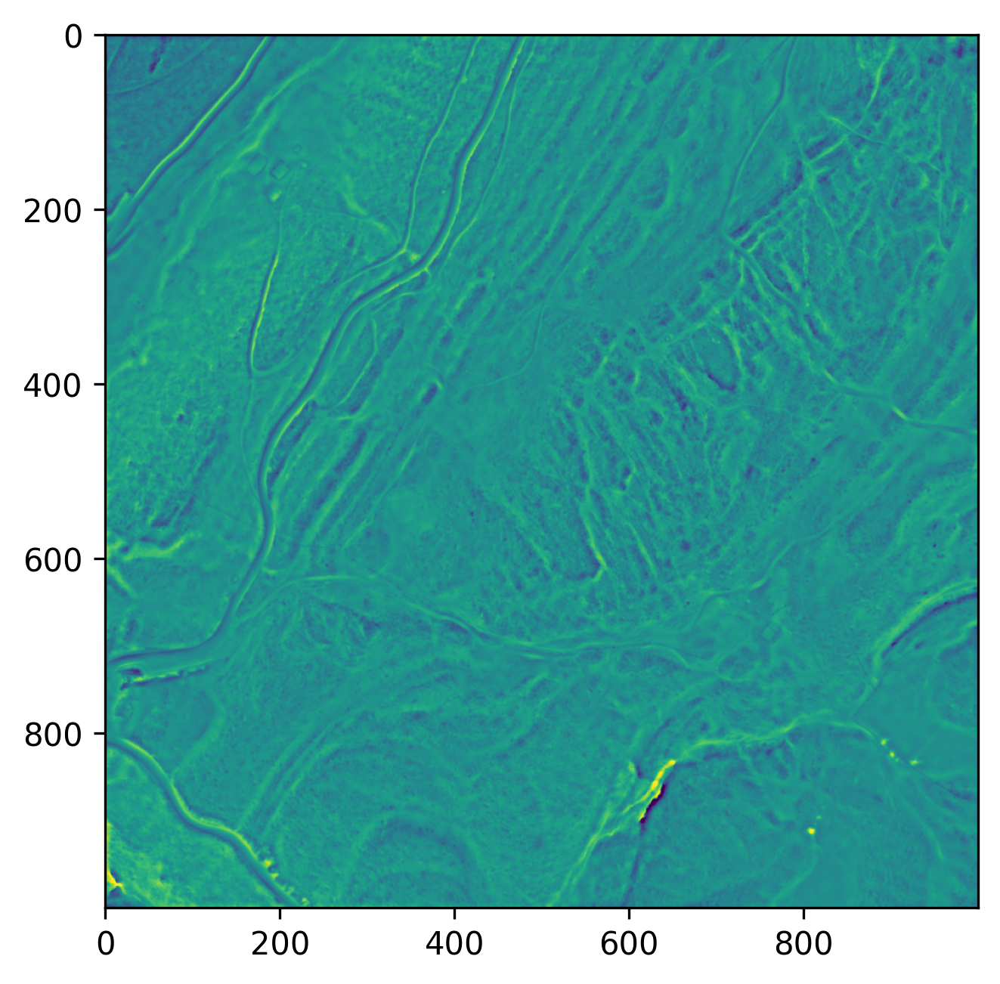

In [16]:
eval_coords = get_mgrid(sidelength, 2).cuda()
model_output, eval_coords = shape_model(eval_coords)

model_output = model_output.view(sidelength, sidelength).cpu().detach().numpy()
residual = model_output - gt_img

residual_range = (np.min(residual), np.max(residual))
print(f"Residual range: {residual_range}")

fig, ax = plt.subplots(figsize=(5, 5), dpi=300)
ax.imshow(residual, vmin=-0.02, vmax=0.02)

residual = (residual - residual_range[0]) / (residual_range[1] - residual_range[0])
residual = Image.fromarray(residual)
residual = Compose(
    [
        ToTensor(),
        Normalize(torch.Tensor([0.5]), torch.Tensor([0.5])),
    ]
)(residual)

if os.path.exists(f"{output_dir}/geo_model.pth"):
    geo_model.load_state_dict(torch.load(f"{output_dir}/geo_model.pth"))
    geo_model.cuda()
    print("Models loaded")
else:
    dataloader = DataLoader(
        ImageFitting(residual, sidelength),
        batch_size=1,
        pin_memory=True,
        num_workers=0,
    )
    geo_model = fit_inr(
        residual,
        sidelength,
        geo_model,
        dataloader,
        num_steps=2401,
        steps_til_summary=500,
    )

Final PSNR: 66.39307498931885


<Axes: >

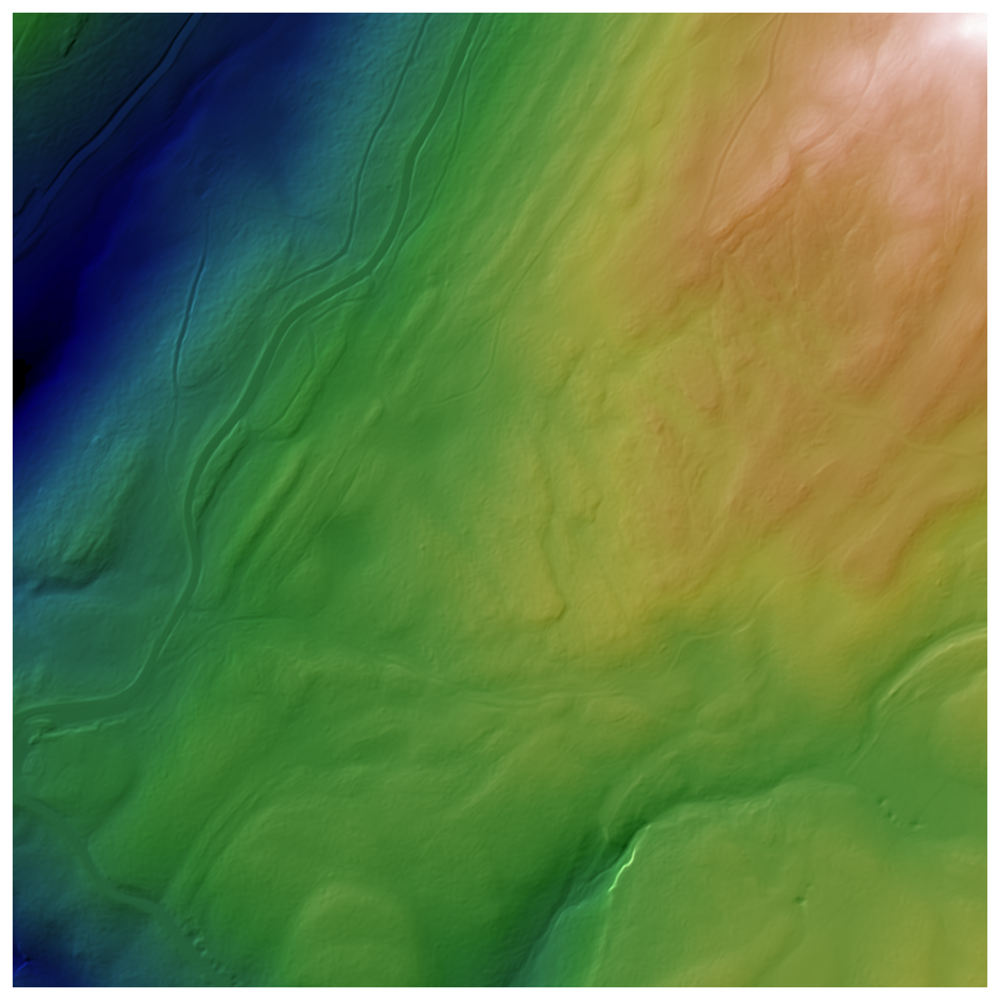

In [17]:
eval_coords = get_mgrid(sidelength, 2).cuda()
shape_model_output, _ = shape_model(eval_coords)
geo_model_output, _ = geo_model(eval_coords)

model_output = shape_model_output - (geo_model_output * 0.5 + 0.5) * (residual_range[1] - residual_range[0]) - residual_range[0]
model_output = model_output.view(sidelength, sidelength).cpu().detach().numpy()
psnr = -10 * np.log10(((model_output - gt_img) ** 2).mean())
print(f"Final PSNR: {psnr}")

hillshade(model_output)

In [18]:
# Save the model
torch.save(shape_model.state_dict(), f"{output_dir}/shape_model.pth")
torch.save(geo_model.state_dict(), f"{output_dir}/geo_model.pth")

## CriticalNet

### Discrete Forman method

In [19]:
# convert the shape_model_output to an OFF file
eval_coords = get_mgrid(sidelength // 2, 2).cuda()
shape_model_output, _ = shape_model(eval_coords)
shape_model_output = (
    shape_model_output.view(sidelength // 2, sidelength // 2).cpu().detach().numpy()
)

vertex_values = (shape_model_output + 1.0) * 0.5 * (value_range[1] - value_range[0]) + value_range[0]

with open(f"{output_dir}/shape_model.off", "w") as f:
    sl = sidelength // 2
    res = 2
    f.write("OFF\n")
    f.write(f"{sl * sl} {2 * (sl - 1) * (sl - 1)} 0\n")
    for i in range(sl):
        for j in range(sl):
            f.write(f"{i * res + 0.5} {j * res + 0.5} {vertex_values[i, j]}\n")

    for i in range(sl - 1):
        for j in range(sl - 1):
            f.write(f"3 {i * sl + j} {(i + 1) * sl + j} {i * sl + j + 1}\n")
            f.write(f"3 {i * sl + j + 1} {(i + 1) * sl + j} {(i + 1) * sl + j + 1}\n")

# revert the edge connection
with open(f"{output_dir}/shape_model_alt.off", "w") as f:
    sl = sidelength // 2
    res = 2
    f.write("OFF\n")
    f.write(f"{sl * sl} {2 * (sl - 1) * (sl - 1)} 0\n")
    for i in range(sl):
        for j in range(sl):
            f.write(f"{i * res + 0.5} {j * res + 0.5} {vertex_values[i, j]}\n")

    for i in range(sl - 1):
        for j in range(sl - 1):
            f.write(f"3 {i * sl + j} {(i + 1) * sl + j + 1} {i * sl + j + 1}\n")
            f.write(
                f"3 {i * sl + j} {(i + 1) * sl + j} {(i + 1) * sl + j + 1}\n"
            )

In [ ]:
!./implicitterrain_demo/forman {output_dir}/shape_model.off
!./implicitterrain_demo/forman {output_dir}/shape_model_alt.off

In [21]:
def read_paths_from_vtk(infile):
    pts = list()
    edges = list()
    p2es = dict()  # pid: [[p1,p2], ... ]
    # read from vtk file
    with open(infile) as f:
        while True:
            line = f.readline()
            if line.startswith("POINTS"):
                pts_num = int(line.split()[1])
                break
        for i in range(pts_num):
            line = f.readline()
            line = line.strip().split()
            pts.append([float(line[0]), float(line[1]), float(line[2])])

        while True:
            line = f.readline()
            if line.startswith("CELLS"):
                lines_num = int(line.split()[1])
                break
        for i in range(lines_num):
            line = f.readline()
            line = line.strip().split()
            edges.append([int(line[1]), int(line[2])])

        while True:
            line = f.readline()
            if line.startswith("CELL_DATA"):
                break
        line = f.readline()  # FIELD ...
        line = f.readline()  # xxx 1 xxx int
        line = f.readline().strip().split()  # real data
        # print(f"{len(line)}")
        for i in range(len(line)):
            pid = int(line[i])
            if pid not in p2es:
                p2es[pid] = list()
            p2es[pid].append(edges[i])

    # merge the edges to form the paths
    # each path is a list of points
    # print(f"paths #: {len(p2es)}")
    vps = list()
    for path_id, es in p2es.items():
        pid = 0
        tmp_p2id = dict()
        tmp_es = list()  # new edges es
        for e in es:
            pid1, pid2 = e
            p1 = tuple(pts[pid1])
            p2 = tuple(pts[pid2])
            if p1 not in tmp_p2id:
                tmp_p2id[p1] = pid
                pid += 1
            if p2 not in tmp_p2id:
                tmp_p2id[p2] = pid
                pid += 1
            tmp_es.append([tmp_p2id[p1], tmp_p2id[p2]])
        tmp_pts = [None for i in range(len(tmp_p2id))]
        for p, pid in tmp_p2id.items():
            tmp_pts[pid] = p

        tmp_adj = dict()  # pid: [pids]. pid is based on tmp_pts
        for e in tmp_es:
            p1, p2 = e
            if p1 not in tmp_adj:
                tmp_adj[p1] = list()
            if p2 not in tmp_adj:
                tmp_adj[p2] = list()
            tmp_adj[p1].append(p2)
            tmp_adj[p2].append(p1)
        # find the start point
        start = 0  # note: consider it. how about a cirle? is it possible? saddle to 2 same min.
        is_circle = True
        for p, ps in tmp_adj.items():
            if len(ps) == 1:
                start = p
                is_circle = False
                break

        # traverse the path
        visited = set()
        vp = list()
        vp.append(tmp_pts[start])
        pre = start
        cur = tmp_adj[start][0]
        visited.add(pre)
        while True:
            vp.append(tmp_pts[cur])
            visited.add(cur)
            if len(tmp_adj[cur]) == 1:
                break
            for nbr in tmp_adj[cur]:
                reach_end = True
                if nbr not in visited:
                    pre = cur
                    cur = nbr
                    reach_end = False
                    break
            if reach_end:
                break
        vps.append(vp)
    print(f"vps #: {len(vps)}")

    return vps

def cut_path(vp, p):
    # p: saddle point
    # vp: current path
    # return new_vp1, new_vp2

    # from points in vp, find the closest point's id to p
    cut_pid = 0
    cur_q = vp[0]
    sm_dis_sq = (p[0] - cur_q[0]) ** 2 + (p[1] - cur_q[1]) ** 2
    for i in range(1, len(vp)):
        cur_q = vp[i]
        tmp_dis_sq = (p[0] - cur_q[0]) ** 2 + (p[1] - cur_q[1]) ** 2
        if tmp_dis_sq < sm_dis_sq:
            sm_dis_sq = tmp_dis_sq
            cut_pid = i
    new_vp1 = vp[: cut_pid + 1]
    new_vp2 = vp[cut_pid:]
    return new_vp1, new_vp2

def finer_vpaths(vps, saddle_pts):
    # given saddle points, to have 4 vpaths for each saddle.
    # print(f"vps #: {len(vps)}")
    print(f"\nstart finer")
    visited_saddle_ids = set()
    new_vps = list()
    for vpid in range(len(vps)):
        vp = vps[vpid]
        cut = False
        for sip in range(len(saddle_pts)):
            if sip in visited_saddle_ids:
                # pass
                continue
            p = saddle_pts[sip]
            x, y, *_ = p
            for pid1 in range(len(vp) - 1):
                pid2 = pid1 + 1
                p2 = vp[pid1]
                p3 = vp[pid2]

                p2dis = (p[0] - p2[0]) ** 2 + (p[1] - p2[1]) ** 2
                p3dis = (p[0] - p3[0]) ** 2 + (p[1] - p3[1]) ** 2
                if p2dis < 0.1:
                    # split vp into two lists
                    idx = pid1
                    new_vp1 = vp[: idx + 1]
                    new_vp2 = vp[idx:]
                    new_vps.append(new_vp1)
                    new_vps.append(new_vp2)
                    cut = True
                    visited_saddle_ids.add(sip)
                    break
                if p3dis < 0.1:
                    # split vp into two lists
                    idx = pid2
                    new_vp1 = vp[: idx + 1]
                    new_vp2 = vp[idx:]
                    new_vps.append(new_vp1)
                    new_vps.append(new_vp2)
                    cut = True
                    visited_saddle_ids.add(sip)
                    break

                mp = ((p2[0] + p3[0]) / 2, (p2[1] + p3[1]) / 2)
                x1, y1, *_ = mp
                tmp_dist = (x - x1) ** 2 + (y - y1) ** 2
                # print(f"{p}, {mp}: {tmp_dist:.3f}")

                if (
                    tmp_dist < 0.1
                ):  # todo: consider the distance, saddle be the same...double check the code.
                    # split vp into two lists
                    idx = pid1
                    new_vp1 = vp[: idx + 1]
                    new_vp2 = vp[idx:]
                    new_vps.append(new_vp1)
                    new_vps.append(new_vp2)
                    cut = True
                    visited_saddle_ids.add(sip)
                    break
            if cut:
                # break
                print(f"path {vpid} cut, at sip {sip}")
                break
        if not cut:
            print(f"path {vpid} not cut")
            # fast way to fix the bug, assume the saddle id is the same as the vp id.
            if vpid in visited_saddle_ids:
                print(
                    f"error: sid {vpid} visited, but it should be assigned to the current vp {vpid}"
                )
                print(f"send the bug report to the author Xin.")
            else:
                print(f"sid {vpid} is valid.")
            
            new_vp1, new_vp2 = cut_path(vp, saddle_pts[vpid])
            new_vps.append(new_vp1)
            new_vps.append(new_vp2)
            visited_saddle_ids.add(vpid)

    print(f"finer vps #: {len(new_vps)}")
    return new_vps

colors = {
    "saddle": "#F04FB3aa",
    "maxima": "#FA9200aa",
    "minima": "#370075aa",
    "asc": "#F5533C",
    "des": "#AF71FA",
}

def plot_vpaths(vps1, vps2, cps, bg_dta, resolution):
    sl = len(bg_dta)
    ax = hillshade(bg_dta, azimuth=315, angle_altitude=45)

    # plot vps in 2d
    for i in range(int(len(vps2) / 2)):
        vp = vps2[2 * i]
        ax.plot(
            [pt[1] / resolution for pt in vp],
            [pt[0] / resolution for pt in vp],
            "-",
            linewidth=1,
            color=colors["asc"],
            alpha=1.0,
        )
        vp = vps2[2 * i + 1]
        ax.plot(
            [pt[1] / resolution for pt in vp],
            [pt[0] / resolution for pt in vp],
            "-",
            linewidth=1,
            color=colors["asc"],
            alpha=1.0,
        )

    for i in range(int(len(vps1) / 2)):
        vp = vps1[2 * i]
        ax.plot(
            [pt[1] / resolution for pt in vp],
            [pt[0] / resolution for pt in vp],
            "-",
            linewidth=1,
            color=colors["des"],
            alpha=1.0,
        )
        vp = vps1[2 * i + 1]
        ax.plot(
            [pt[1] / resolution for pt in vp],
            [pt[0] / resolution for pt in vp],
            "-",
            linewidth=1,
            color=colors["des"],
            alpha=1.0,
        )

    # plot cps
    ax.scatter(
        [pt[1] / resolution for pt in cps if pt[3] == 0],
        [pt[0] / resolution for pt in cps if pt[3] == 0],
        color=colors["minima"],
        label="min",
        marker="v",
        edgecolor="black",
        zorder=10,
    )
    ax.scatter(
        [pt[1] / resolution for pt in cps if pt[3] == 1],
        [pt[0] / resolution for pt in cps if pt[3] == 1],
        color=colors["saddle"],
        label="saddle",
        marker="o",
        edgecolor="black",
        zorder=10,
    )
    ax.scatter(
        [pt[1] / resolution for pt in cps if pt[3] == 2],
        [pt[0] / resolution for pt in cps if pt[3] == 2],
        color=colors["maxima"],
        label="max",
        marker="^",
        edgecolor="black",
        zorder=10,
    )

    # move origin to top-left
    ax.set_xlim(0, sl)
    ax.set_ylim(sl, 0)
    plt.show()

def net_from_netfile(infile):
    # netfile format:
    # pts_num edges_num
    # x y z type
    # ...
    # pid1 pid2
    # ...
    pts = list()  # (x,y,z,type)
    edges = list()  # (pid1,pid2,type)
    with open(infile, "r") as f:
        line = f.readline().strip().split()
        pts_num = int(line[0])
        edges_num = int(line[1])
        print(f"pts_num: {pts_num}, edges_num: {edges_num}")
        for i in range(pts_num):
            line = f.readline().strip().split()
            pts.append((float(line[0]), float(line[1]), float(line[2]), int(line[3])))
        for i in range(edges_num):
            line = f.readline().strip().split()
            v1 = int(line[0])
            v2 = int(line[1])
            t1 = pts[v1][3]
            t2 = pts[v2][3]
            t = t1
            if t == 1:
                t = t2
            edges.append((v1, v2, t))
    return pts, edges

vps #: 149
vps #: 149
saddle min paths #: 149
saddle max paths #: 149
pts_num: 299, edges_num: 577
saddle pts #: 149

start finer
path 0 cut, at sip 0
path 1 cut, at sip 1
path 2 cut, at sip 2
path 3 cut, at sip 3
path 4 cut, at sip 4
path 5 cut, at sip 5
path 6 cut, at sip 6
path 7 cut, at sip 7
path 8 cut, at sip 8
path 9 cut, at sip 9
path 10 cut, at sip 10
path 11 cut, at sip 11
path 12 cut, at sip 12
path 13 cut, at sip 13
path 14 cut, at sip 14
path 15 cut, at sip 15
path 16 cut, at sip 16
path 17 cut, at sip 17
path 18 cut, at sip 18
path 19 cut, at sip 19
path 20 cut, at sip 20
path 21 cut, at sip 21
path 22 cut, at sip 22
path 23 cut, at sip 23
path 24 cut, at sip 24
path 25 cut, at sip 25
path 26 cut, at sip 26
path 27 cut, at sip 27
path 28 cut, at sip 28
path 29 cut, at sip 29
path 30 cut, at sip 30
path 31 cut, at sip 31
path 32 cut, at sip 32
path 33 cut, at sip 33
path 34 cut, at sip 34
path 35 cut, at sip 35
path 36 cut, at sip 36
path 37 cut, at sip 37
path 38 cut, at 

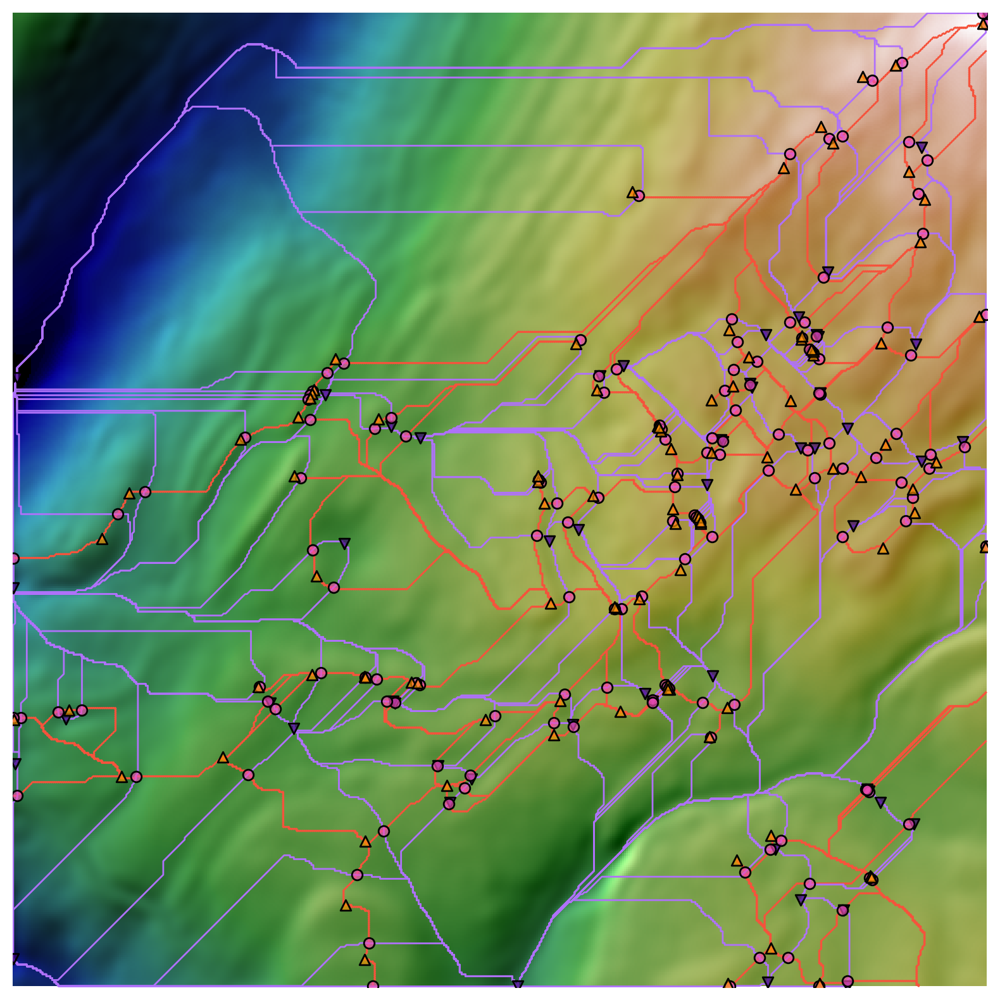

In [22]:
saddle_min_paths = read_paths_from_vtk(f"{output_dir}/shape_model_descending1cells.vtk")
saddle_max_paths = read_paths_from_vtk(f"{output_dir}/shape_model_ascending1cells.vtk")
print(f"saddle min paths #: {len(saddle_min_paths)}")
print(f"saddle max paths #: {len(saddle_max_paths)}")

cps, edges = net_from_netfile(f"{output_dir}/shape_model_cp_net.txt")
saddle_pts = [pt for pt in cps if pt[3] == 1]
print(f"saddle pts #: {len(saddle_pts)}")

saddle_min_paths = finer_vpaths(saddle_min_paths, saddle_pts)
saddle_max_paths = finer_vpaths(saddle_max_paths, saddle_pts)
print(f"finer 4 way paths #: {len(saddle_min_paths)}, {len(saddle_max_paths)}")

plot_vpaths(saddle_min_paths, saddle_max_paths, cps, shape_model_output, 2)

vps #: 165
vps #: 165
saddle min paths #: 165
saddle max paths #: 165
pts_num: 331, edges_num: 641
saddle pts #: 165

start finer
path 0 cut, at sip 0
path 1 cut, at sip 1
path 2 cut, at sip 2
path 3 cut, at sip 3
path 4 cut, at sip 4
path 5 cut, at sip 5
path 6 cut, at sip 6
path 7 cut, at sip 7
path 8 cut, at sip 8
path 9 cut, at sip 9
path 10 cut, at sip 10
path 11 cut, at sip 11
path 12 cut, at sip 12
path 13 cut, at sip 13
path 14 cut, at sip 14
path 15 cut, at sip 15
path 16 cut, at sip 16
path 17 cut, at sip 17
path 18 cut, at sip 18
path 19 cut, at sip 19
path 20 cut, at sip 20
path 21 cut, at sip 21
path 22 cut, at sip 22
path 23 cut, at sip 23
path 24 cut, at sip 24
path 25 cut, at sip 25
path 26 cut, at sip 26
path 27 cut, at sip 27
path 28 cut, at sip 28
path 29 cut, at sip 29
path 30 cut, at sip 30
path 31 cut, at sip 31
path 32 cut, at sip 32
path 33 cut, at sip 33
path 34 cut, at sip 34
path 35 cut, at sip 35
path 36 cut, at sip 36
path 37 cut, at sip 37
path 38 cut, at 

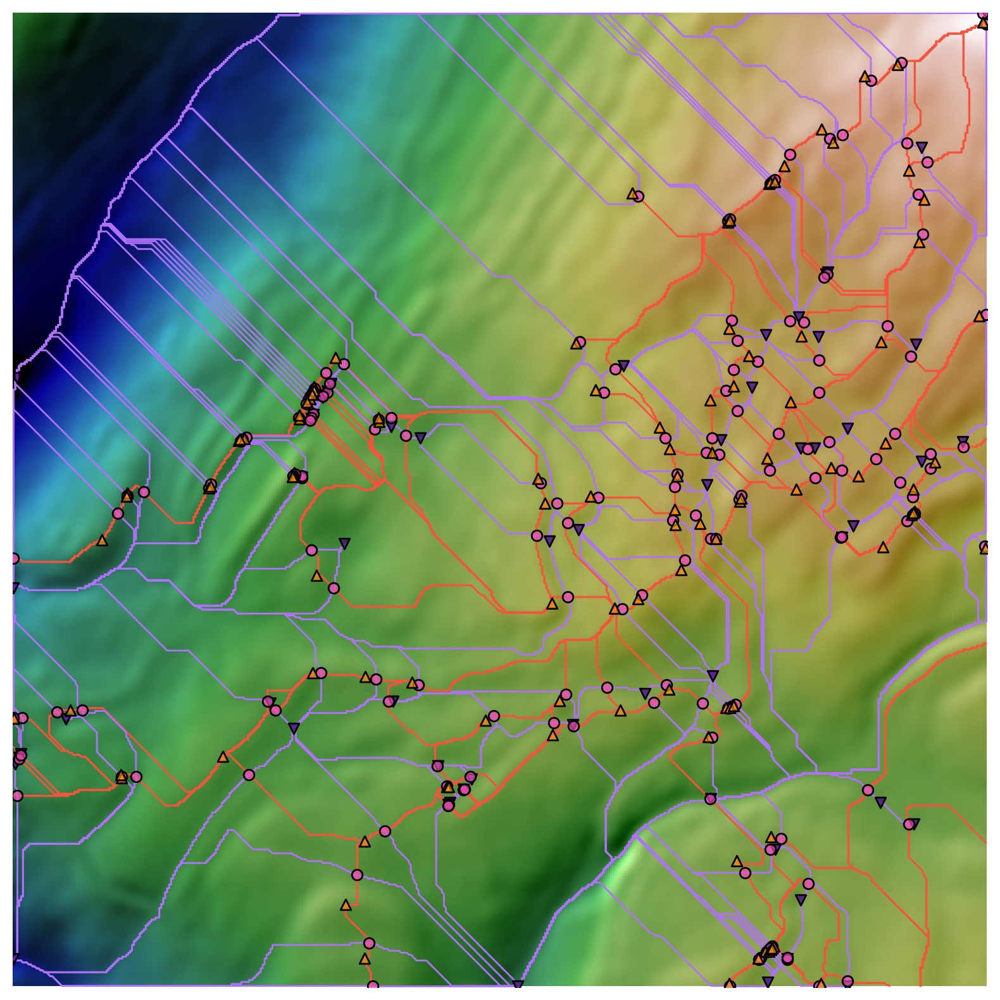

In [23]:
saddle_min_paths = read_paths_from_vtk(f"{output_dir}/shape_model_alt_descending1cells.vtk")
saddle_max_paths = read_paths_from_vtk(f"{output_dir}/shape_model_alt_ascending1cells.vtk")
print(f"saddle min paths #: {len(saddle_min_paths)}")
print(f"saddle max paths #: {len(saddle_max_paths)}")

cps, edges = net_from_netfile(f"{output_dir}/shape_model_alt_cp_net.txt")
saddle_pts = [pt for pt in cps if pt[3] == 1]
print(f"saddle pts #: {len(saddle_pts)}")

saddle_min_paths = finer_vpaths(saddle_min_paths, saddle_pts)
saddle_max_paths = finer_vpaths(saddle_max_paths, saddle_pts)
print(f"finer 4 way paths #: {len(saddle_min_paths)}, {len(saddle_max_paths)}")

plot_vpaths(saddle_min_paths, saddle_max_paths, cps, shape_model_output, 2)

`shape_model` and `shape_model_alt` demonstrate the influence of different edge connection configurations on the resulting terrain.

### A simple separatrix tracing method for INR

In [38]:
# first use the discrete forman method's result for Critical points
def read_critical_net_file(file):
    vertices, edges = [], []
    pers = []  # (birth, death)
    with open(file, "r") as f:
        v_num, e_num = map(int, f.readline().strip().split())
        for _ in range(v_num):
            x, y, z, t = map(float, f.readline().strip().split())
            vertices.append((x, y, z, int(t)))

        for _ in range(e_num):
            v1, v2 = map(int, f.readline().strip().split())
            edge_type = 0 if vertices[v1][3] + vertices[v2][3] == 1 else 2
            edges.append((v1, v2, edge_type))

            # saddle-min, or saddle-max
            pers.append(
                (
                    min(vertices[v1][2], vertices[v2][2]),
                    max(vertices[v1][2], vertices[v2][2]),
                )
            )
    print(f"{file = }, {len(vertices) = }, {len(edges) = }")
    return vertices, edges, np.array(pers)

res = 500 / 1000
candidate_locations = set()

if os.path.exists(f"{output_dir}/shape_model_cp_net.txt"):
    print("Appending mesh result")
    vertices, _, _ = read_critical_net_file(f"{output_dir}/shape_model_cp_net.txt")
    vertices = [(v[0] * res, v[1] * res) for v in vertices]
    candidate_locations.update(vertices)
if os.path.exists(f"{output_dir}/shape_model_alt_cp_net.txt"):
    print("Appending mesh result (alt)")
    vertices, _, _ = read_critical_net_file(f"{output_dir}/shape_model_alt_cp_net.txt")
    vertices = [(v[0] * res, v[1] * res) for v in vertices]
    candidate_locations.update(vertices)

candidate_locations = list(candidate_locations)
candidate_locations = np.array(candidate_locations)
candidate_locations = candidate_locations.astype(np.float32)

print(f"{candidate_locations.shape = }")

Appending mesh result
file = './implicitterrain_demo/2494_1141/shape_model_cp_net.txt', len(vertices) = 299, len(edges) = 577
Appending mesh result (alt)
file = './implicitterrain_demo/2494_1141/shape_model_alt_cp_net.txt', len(vertices) = 331, len(edges) = 641
candidate_locations.shape = (558, 2)


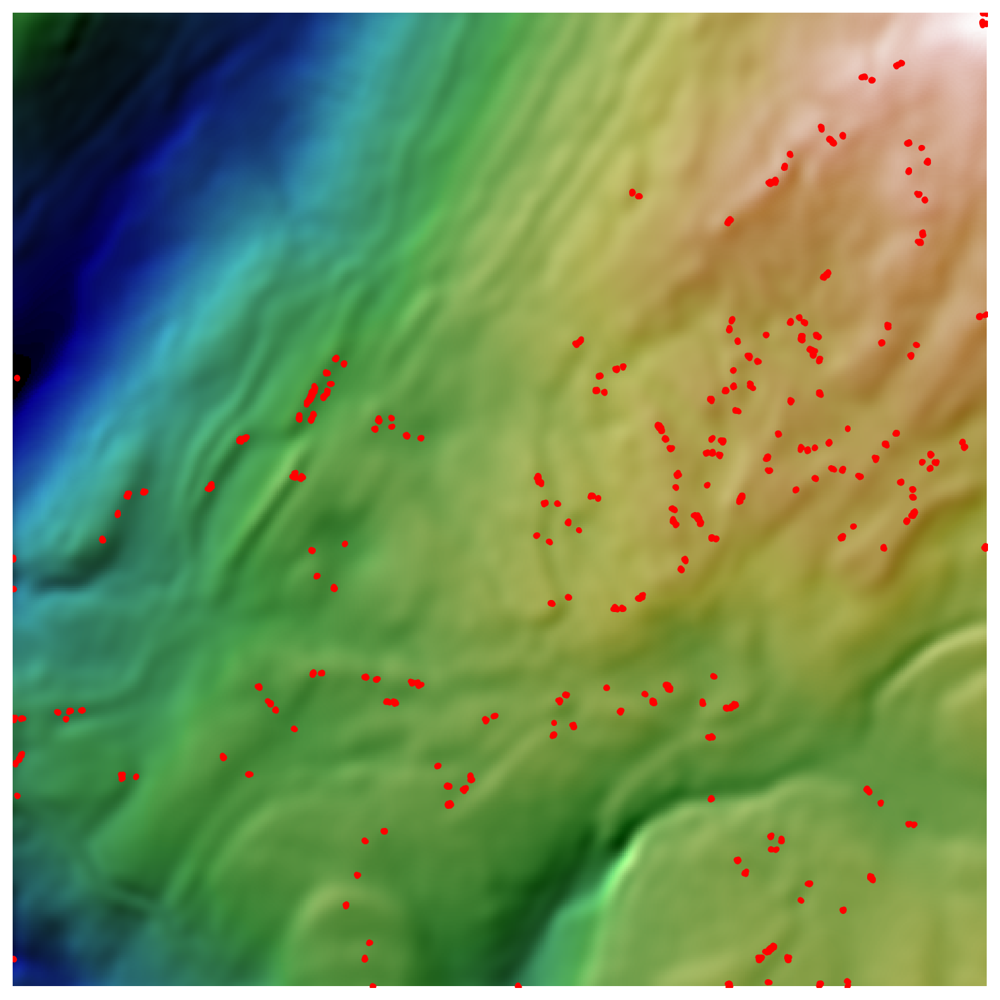

In [39]:
# make duplicate for each candidate location and random jitter the candidate locations
tmp = np.repeat(candidate_locations, 5, axis=0)
tmp += np.random.normal(0, 0.3, size=tmp.shape)
candidate_locations = np.vstack([candidate_locations, tmp])

# clamp back to the image size
candidate_locations = np.clip(candidate_locations, 0, 500)

ax = hillshade(shape_model_output)
ax.scatter(
    candidate_locations[:, 1],
    candidate_locations[:, 0],
    c="r",
    s=4,
)
ax.set_xlim(0, 500)
ax.set_ylim(500, 0)
plt.show()

In [44]:
# walk from each candidate location following the gradient
def gradient(y, x, grad_outputs=None):
    if grad_outputs is None:
        grad_outputs = torch.ones_like(y)
    grad = torch.autograd.grad(y, [x], grad_outputs=grad_outputs, create_graph=True)[0]
    return grad

def walk_to_minimize_grad_norm(
    candidate_coords,
    init_step_size,
    model,
    convergence_thresh,
    max_iteration=100,
):
    """
    candidate_coords: np.array, shape (N, 2), the candidate locations in coord space
    init_step_size: float, the initial step size for the walk, in coord space unit
    model: torch model, the model to evaluate the height and gradient
    convergence_thresh: float, the convergence threshold for the gradient norm
    max_iteration: int, the maximum number of iterations for the walk
    """
    N = candidate_coords.shape[0]
    step_sizes = (
        torch.ones(1, N, 1, requires_grad=False).float().cuda() * init_step_size
    )
    coords = torch.from_numpy(candidate_coords).float()[None, :, :].cuda()

    converged_point_idx = None
    prev_grad_dir = None

    for _ in range(max_iteration):
        model_output, coords = model(coords)
        grad = gradient(model_output, coords)
        # test convergned coords
        converged_point_idx = (grad.norm(dim=-1) < convergence_thresh).nonzero(
            as_tuple=False
        )[:, 1]

        # avoid points outside the border
        outside_border_idx = (
            (coords < -1).any(dim=-1) | (coords > 1).any(dim=-1)
        ).nonzero(as_tuple=False)[:, 1]

        # if all step_sizes are zero, break
        if step_sizes.sum() == 0:
            break

        # update coords
        H_x = gradient(grad[:, :, 0], coords)  # 1 x N x 2 <f_xx, f_xy>
        H_y = gradient(grad[:, :, 1], coords)  # 1 x N x 2 <f_yx, f_yy>
        # grad_norm's gradient ascent direction is <f_x f_xx + f_y f_yx, f_x f_xy + f_y f_yy>
        grad_direction = torch.stack(
            [
                grad[:, :, 0] * H_x[:, :, 0] + grad[:, :, 1] * H_y[:, :, 0],
                grad[:, :, 0] * H_x[:, :, 1] + grad[:, :, 1] * H_y[:, :, 1],
            ],
            dim=-1,
        )  # 1 x N x 2
        grad_direction = grad_direction / grad_direction.norm(dim=-1, keepdim=True)

        if prev_grad_dir is not None:
            # compare the angle between previous step gradient direction and current step gradient direction
            # if the angle is larger than 90 degree, shrink the step size
            cos_angles = torch.sum(
                grad_direction * prev_grad_dir, dim=-1, keepdim=True
            )  # 1 x N x 1
            step_sizes[cos_angles < 0] *= 0.5
            # set the minimum step size to 0.1 of the initial step size
            step_sizes[step_sizes < 0.1 * init_step_size] = 0.1 * init_step_size

        step_sizes[0, converged_point_idx, 0] = 0
        step_sizes[0, outside_border_idx, 0] = 0

        prev_grad_dir = grad_direction
        coords = coords - grad_direction * step_sizes

    converged_point_idx = converged_point_idx.detach().cpu().numpy()
    outside_border_idx = outside_border_idx.detach().cpu().numpy()
    print(f"Converged points: {converged_point_idx.shape}")
    print(f"Outside border points: {outside_border_idx.shape}")

    converged_points = coords.view(-1, 2).detach().cpu().numpy()[converged_point_idx]

    return converged_points

converged_points = walk_to_minimize_grad_norm(
    candidate_locations / 500 * 2.0 - 1.0,
    1 / 1000,
    shape_model,
    1e-3 / (value_range[1] - value_range[0]) * 1000,
    1000,
)
print(f"Converged points: {converged_points.shape}")

Converged points: (3024,)
Outside border points: (30,)
Converged points: (3024, 2)


In [48]:
class CriticalPoint:
    def __init__(self, coord, z, type):
        """
        coord: (x, y) coordinates in the image space
        z: height of the critical point [-1, 1]
        type: int, 0 for minimum, 1 for saddle, 2 for maximum

        """
        self.coord = coord
        self.z = z
        self.type = type


class CriticalNet:
    def __init__(self):
        """
        CriticalNet store the critical points and paths between them. For the validation stage, missed critical points and paths can be identified, while do not modify the data inside this class.
        Export the CriticalNet as a Graph object to modify the nodes and edges for further analysis.
        """
        self.saddles = []
        self.maxima = []
        self.minima = []
        self.edges = []

        self.G = None

    def add_path(self, start_cp, end_cp, type):
        """
        start_cp: critical saddle point
        end_cp: CriticalPoint of type 0 or 2
        type: int, 0 for descending path from saddle to minimum, 2 for ascending path from saddle to maximum
        """
        start_cp_id = -1
        end_cp_id = -1
        if start_cp not in self.saddles:
            self.saddles.append(start_cp)
            start_cp_id = len(self.saddles) - 1
        else:
            start_cp_id = self.saddles.index(start_cp)

        if type == 0:  # descending path from saddle to minimum
            if end_cp not in self.minima:
                self.minima.append(end_cp)
                end_cp_id = len(self.minima) - 1
            else:
                end_cp_id = self.minima.index(end_cp)
        elif type == 2:  # ascending path from saddle to maximum
            if end_cp not in self.maxima:
                self.maxima.append(end_cp)
                end_cp_id = len(self.maxima) - 1
            else:
                end_cp_id = self.maxima.index(end_cp)

        self.edges.append((start_cp_id, end_cp_id, type))


def get_cpts(converged_pts, model):
    N = len(converged_pts)
    coords = torch.from_numpy(converged_pts).float()[None, :, :].cuda()
    model_output, coords = model(coords)
    zs = model_output.view(N).detach().cpu().numpy()
    grad = gradient(model_output, coords)
    H_x = gradient(grad[:, :, 0], coords)  # 1 x N x 2 <f_xx, f_xy>
    H_y = gradient(grad[:, :, 1], coords)  # 1 x N x 2 <f_yx, f_yy>
    H = torch.stack([H_x, H_y], dim=-1)
    H_det = torch.linalg.det(H).squeeze(0).detach().cpu().numpy()
    H = H.squeeze(0).detach().cpu().numpy()
    coords = coords.view(N, 2).detach().cpu().numpy()

    minima, saddles, maxima = [], [], []
    for coord, z, h, det in zip(coords, zs, H, H_det):
        if det > 0:
            if h[0, 0] > 0:
                minima.append(CriticalPoint(coord, z, 0))
            else:
                maxima.append(CriticalPoint(coord, z, 2))
        elif det < 0:
            saddles.append(CriticalPoint(coord, z, 1))
        else:
            print("Error: cannot determine the type from Hessian matrix")

    return minima, saddles, maxima, H[H_det < 0]

from scipy.spatial import cKDTree
def cluster_cps(critical_points, close_thresh):
    if len(critical_points) == 0:
        return critical_points, []
    cp_coords = np.array([cp.coord for cp in critical_points])
    tree = cKDTree(cp_coords)
    mask = np.ones(cp_coords.shape[0], dtype=bool)
    for i, pt in enumerate(cp_coords):
        if mask[i]:
            close_pts = tree.query_ball_point(pt, close_thresh)
            mask[close_pts] = False
            mask[i] = True

    result = []
    for i, cp in enumerate(critical_points):
        if mask[i]:
            result.append(cp)
    return result, mask


minima, saddles, maxima, saddle_H = get_cpts(converged_points, shape_model)
# for each type of critical points, remove the close ones
minima, _ = cluster_cps(minima, 1e-3)
maxima, _ = cluster_cps(maxima, 1e-3)
_, saddle_mask = cluster_cps(saddles, 1e-3)
saddles = [saddles[i] for i in range(len(saddles)) if saddle_mask[i]]
saddle_H = saddle_H[saddle_mask]
print(f"{len(minima) = }, {len(saddles) = }, {len(maxima) = }")

len(minima) = 41, len(saddles) = 134, len(maxima) = 94


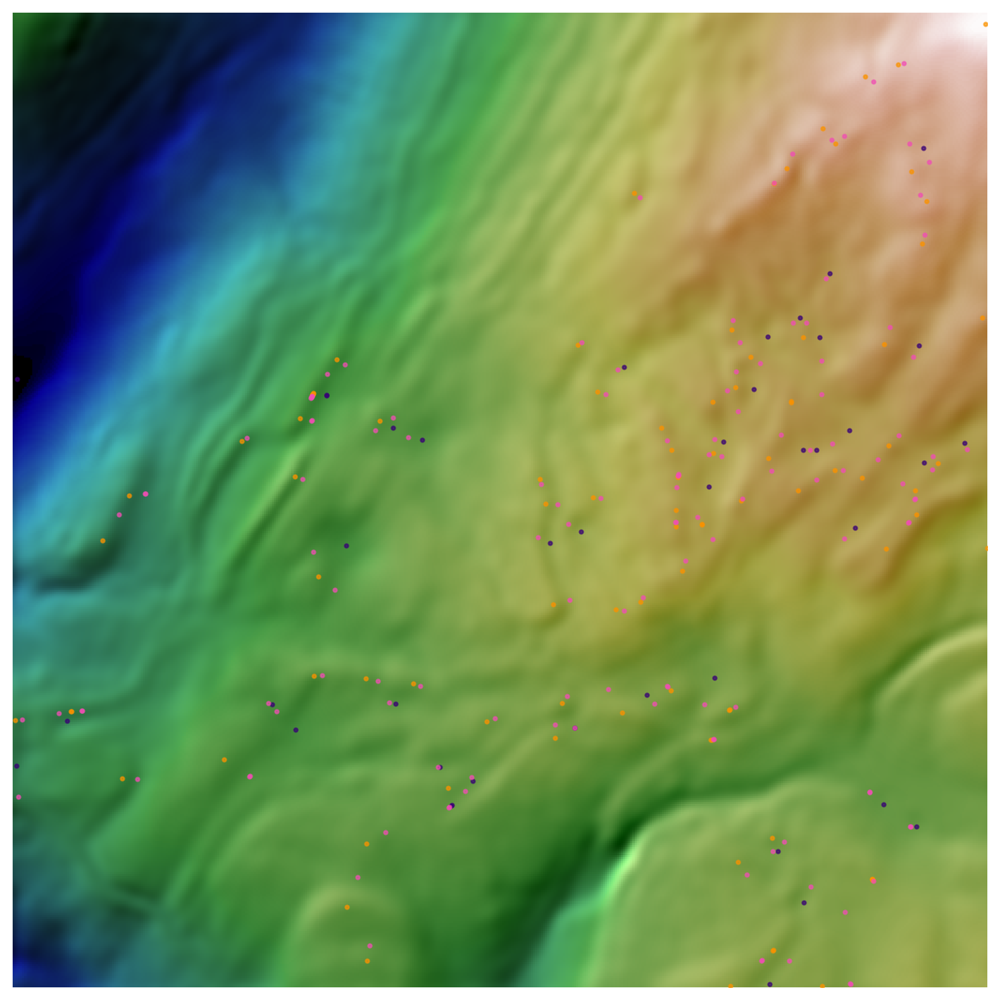

In [53]:
# visualize the critical points
ax = hillshade(shape_model_output)
ax.scatter(
    [(cp.coord[1] * 0.5 + 0.5) * 500 for cp in minima],
    [(cp.coord[0] * 0.5 + 0.5) * 500 for cp in minima],
    c=colors["minima"],
    s=4,
)
ax.scatter(
    [(cp.coord[1] * 0.5 + 0.5) * 500 for cp in maxima],
    [(cp.coord[0] * 0.5 + 0.5) * 500 for cp in maxima],
    c=colors["maxima"],
    s=4,
)
ax.scatter(
    [(cp.coord[1] * 0.5 + 0.5) * 500 for cp in saddles],
    [(cp.coord[0] * 0.5 + 0.5) * 500 for cp in saddles],
    c=colors["saddle"],
    s=4,
)

In [57]:
def construct_cn(
    minima,
    saddles,
    maxima,
    saddle_H,
    model,
    init_step_size,
    convergence_thresh,
    close_thresh,
    max_iteration=2000,
):
    # find the start direction from saddle by eigen of the Hessian matrix
    eigen_values, eigen_vectors = np.linalg.eig(saddle_H)

    # a negative eigen value indicates the direction of the ascending path, and a positive eigen value indicates the direction of the descending path
    walk_directions = [[], [], [], []]
    for i in range(len(saddle_H)):
        lambda_1, lambda_2 = eigen_values[i]
        assert lambda_1 * lambda_2 < 0

        v1, v2 = eigen_vectors[i]
        if lambda_1 < 0:
            # ascending path
            walk_directions[0].append(v1)
            walk_directions[1].append(-v1)
            # descending path
            walk_directions[2].append(v2)
            walk_directions[3].append(-v2)
        elif lambda_2 < 0:
            # ascending path
            walk_directions[0].append(v2)
            walk_directions[1].append(-v2)
            # descending path
            walk_directions[2].append(v1)
            walk_directions[3].append(-v1)
    tmp = []
    for walk_direction in walk_directions:
        walk_direction = np.array(walk_direction)
        walk_direction = walk_direction[:, ::-1]
        tmp.append(walk_direction.copy())
    walk_directions = tmp
    walk_directions = [
        torch.from_numpy(walk_direction).float().cuda()
        for walk_direction in walk_directions
    ]
    walk_ascend_descend = [1, 1, -1, -1]
    pathes = [[], [], [], []]

    M = len(saddles)
    coords = None
    for i in range(4):
        del coords
        saddle_coords = np.array([cp.coord for cp in saddles])
        coords = torch.from_numpy(saddle_coords)[None, :, :].float().cuda()

        prev_grad_dir = None
        converged_point_idx = None

        step_sizes = (
            torch.ones(1, M, 1, requires_grad=False).float().cuda() * init_step_size
        )

        pathes[i].append(coords.view(M, 2).detach().cpu().numpy())

        coords = coords + walk_directions[i] * step_sizes * 2.0  # first step is doubled
        for _ in range(max_iteration):
            pathes[i].append(coords.view(M, 2).detach().cpu().numpy())

            model_output, coords = model(coords)
            grad = gradient(model_output, coords)
            grad_norm = grad.norm(dim=-1, keepdim=True)

            # test convergned coords
            converged_point_idx = (grad_norm < convergence_thresh).nonzero(
                as_tuple=False
            )[:, 1]

            # avoid points outside the border
            outside_border_idx = (
                (coords < -1).any(dim=-1) | (coords > 1).any(dim=-1)
            ).nonzero(as_tuple=False)[:, 1]

            # if all step_sizes are zero, break
            if step_sizes.sum() == 0:
                continue # fixme: pathes need be of same size
            # else:
            #     print(f"Step sizes: {step_sizes.sum()}")

            # update coords
            grad_direction = grad / grad_norm
            if prev_grad_dir is not None:
                # compare the angle between previous step gradient direction and current step gradient direction
                # if the angle is larger than 90 degree, shrink the step size
                cos_angles = torch.sum(
                    grad_direction * prev_grad_dir, dim=-1, keepdim=True
                )  # 1 x N x 1
                step_sizes[cos_angles < 0] *= 0.5
                # set the minimum step size to 0.1 of the initial step size
                step_sizes[step_sizes < 0.1 * init_step_size] = 0.1 * init_step_size

            step_sizes[0, converged_point_idx, 0] = 0
            step_sizes[0, outside_border_idx, 0] = 0
            prev_grad_dir = grad_direction
            coords = coords + walk_ascend_descend[i] * grad_direction * step_sizes

    cn = CriticalNet()
    # saddle_tree = cKDTree(np.array([cp.coord for cp in saddles]))
    maxima_tree = cKDTree(np.array([cp.coord for cp in maxima]))
    minima_tree = None
    if len(minima) > 0:
        minima_tree = cKDTree(np.array([cp.coord for cp in minima]))

    # path end points that are not close to the critical points or outside the border
    missed_pathes = []

    # handle the outside border end points first
    missed_maxima, missed_minima = None, None
    missed_maxima_tree, missed_minima_tree = None, None
    for i in range(2):
        pathes = np.array(pathes)
        if i == 0:
            end_points = pathes[:2, -1].reshape(-1, 2)
        else:
            end_points = pathes[2:, -1].reshape(-1, 2)
        outside_border_mask = (end_points < -1).any(axis=-1) | (end_points > 1).any(
            axis=-1
        )
        outside_border_end_points = end_points[outside_border_mask]
        if len(outside_border_end_points) == 0:
            print("No outside border end points")
            continue

        outside_border_end_points = np.clip(outside_border_end_points, -1, 1)
        outside_border_end_points_z, _ = model(
            torch.from_numpy(outside_border_end_points)[None, :, :].float().cuda()
        )
        outside_border_end_points_z = (
            outside_border_end_points_z.view(-1).detach().cpu().numpy()
        )

        # print(f"outside_border_end_points: {outside_border_end_points.shape}, {outside_border_end_points_z.shape}")
        missed_cps = [
            CriticalPoint(
                outside_border_end_points[0], outside_border_end_points_z[0], 2
            )
        ]
        ob_tree = cKDTree([outside_border_end_points[0]])
        for j, pt in enumerate(outside_border_end_points):
            dist, idx = ob_tree.query(pt, k=2)
            if dist[1] > close_thresh:
                cp = CriticalPoint(pt, outside_border_end_points_z[j], 2)
                missed_cps.append(cp)
                ob_tree = cKDTree(np.vstack([ob_tree.data, pt]))

        if i == 0:
            missed_maxima = missed_cps
            missed_maxima_tree = cKDTree([cp.coord for cp in missed_cps])
            print("missed_maxima", len(missed_maxima))
        else:
            missed_minima = missed_cps
            missed_minima_tree = cKDTree([cp.coord for cp in missed_cps])
            print("missed_minima", len(missed_minima))

    # construct the critical net
    for i in range(4):
        if i < 2:
            for j in range(M):
                end_point = pathes[i, -1, j]
                if maxima_tree is not None:
                    dist, idx = maxima_tree.query(end_point, k=1)
                    if dist < close_thresh:
                        cn.add_path(saddles[j], maxima[idx], 2)
                        continue
                if missed_maxima_tree is not None:
                    dist, idx = missed_maxima_tree.query(end_point, k=1)
                    if dist < close_thresh:
                        cn.add_path(saddles[j], missed_maxima[idx], 2)
                        continue
                    else:
                        missed_pathes.append(pathes[i, :, j])
                else:
                    missed_pathes.append(pathes[i, :, j])
        else:
            for j in range(M):
                end_point = pathes[i, -1, j]
                if minima_tree is not None:
                    dist, idx = minima_tree.query(end_point, k=1)
                    if dist < close_thresh:
                        cn.add_path(saddles[j], minima[idx], 0)
                        continue
                if missed_minima_tree is not None:
                    dist, idx = missed_minima_tree.query(end_point, k=1)
                    if dist < close_thresh:
                        cn.add_path(saddles[j], missed_minima[idx], 0)
                    else:
                        missed_pathes.append(pathes[i, :, j])
                else:
                    missed_pathes.append(pathes[i, :, j])

    missed_pathes = np.array(missed_pathes)
    return cn, pathes, missed_pathes, missed_maxima, missed_minima

In [65]:
# NOTE: Improvement can be made:
# 1. capture the missed critical points and paths in the candidate locations
# 2. refine the walking stepsize on the INR surface
cn, pathes, _, _, _ = construct_cn(
    minima,
    saddles,
    maxima,
    saddle_H,
    shape_model,
    2e-3,
    5e-4 / (value_range[1] - value_range[0]) * 1000,
    5e-3,
    max_iteration=3000,
)
print(pathes.shape)

missed_maxima 10
missed_minima 25
(4, 3001, 134, 2)


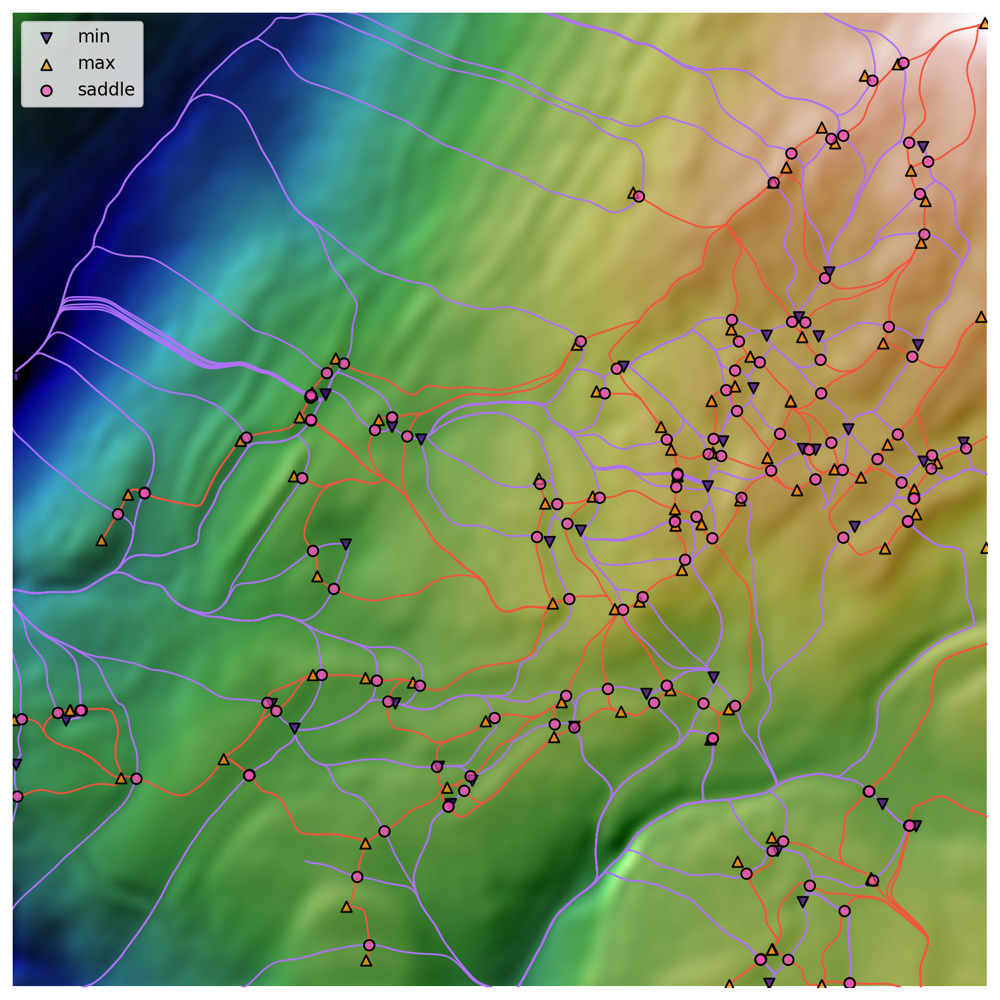

In [69]:
# visualize the separatrix lines
ax = hillshade(shape_model_output)
ax.scatter(
    [(cp.coord[1] * 0.5 + 0.5) * 500 for cp in minima],
    [(cp.coord[0] * 0.5 + 0.5) * 500 for cp in minima],
    c=colors["minima"],
    label="min",
    marker="v",
    edgecolor="black",
    zorder=10,
)
ax.scatter(
    [(cp.coord[1] * 0.5 + 0.5) * 500 for cp in maxima],
    [(cp.coord[0] * 0.5 + 0.5) * 500 for cp in maxima],
    c=colors["maxima"],
    label="max",
    marker="^",
    edgecolor="black",
    zorder=10,
)
ax.scatter(
    [(cp.coord[1] * 0.5 + 0.5) * 500 for cp in saddles],
    [(cp.coord[0] * 0.5 + 0.5) * 500 for cp in saddles],
    c=colors["saddle"],
    label="saddle",
    marker="o",
    edgecolor="black",
    zorder=10,
)
ax.legend()
line_colors = [colors["asc"], colors["asc"], colors["des"], colors["des"]]
for i in range(4):
    for j in range(len(saddles)):
        ax.plot(
            (pathes[i, :, j, 1] * 0.5 + 0.5) * 500,
            (pathes[i, :, j, 0] * 0.5 + 0.5) * 500,
            c=line_colors[i],
            linewidth=1,
        )
ax.set_xlim(0, 500)
ax.set_ylim(500, 0)
plt.show()

From here on, we can further analyze the resulting criticalnet and its abstract topological structure...